# Results on test data againt ground truth, Scroll Down to see results

In [47]:
import glob

import numpy as np
import functools
import random
import tensorflow as tf
import tensorflow_addons as tfa
from sklearn.model_selection import train_test_split
from tensorflow.keras import losses
import tensorflow.keras.backend as K
import segmentation_models as sm

from cb.tbi_cb import TensorBoardImage
from cb.snapshot_cb_builder import SnapshotCallbackBuilder
from cb.sgdr_lr_scheduler import SGDRScheduler

from tensorflow.keras.models import load_model
from tensorflow.keras.models import clone_model
from numpy import average
from numpy import array
import matplotlib.pyplot as plt

In [48]:
x_val_filenames = glob.glob('data/testing/input/*.png')
y_val_filenames = glob.glob('data/testing/output/*.png')

num_val_examples = len(x_val_filenames)

print("Number of validation examples: {}".format(num_val_examples))

Number of validation examples: 52


In [49]:
img_shape = (512, 512, 3)
batch_size = 1
n_classes = 1
epochs = 70
BACKBONE = 'efficientnetb4'

preprocess_input = sm.get_preprocessing(BACKBONE)

In [38]:
def _process_pathnames(fname, label_path):
    img_str = tf.io.read_file(fname)
    img = tf.image.decode_png(img_str, channels=3)

    label_img_str = tf.io.read_file(label_path)
    label_img = tf.image.decode_png(label_img_str)

    label_img = label_img[:, :, 0]
    label_img = tf.expand_dims(label_img, axis=-1)
    return img, label_img

def shift_img(output_img, label_img, width_shift_range, height_shift_range):
    if width_shift_range or height_shift_range:
        if width_shift_range:
            width_shift_range = tf.random.uniform([],
                                                  -width_shift_range * img_shape[1],
                                                  width_shift_range * img_shape[1])
        if height_shift_range:
            height_shift_range = tf.random.uniform([],
                                                   -height_shift_range * img_shape[0],
                                                   height_shift_range * img_shape[0])
        # Translate both
        output_img = tfa.image.translate(output_img,
                                         [width_shift_range, height_shift_range])
        label_img = tfa.image.translate(label_img,
                                        [width_shift_range, height_shift_range])
    return output_img, label_img


def flip_img(horizontal_flip, tr_img, label_img):
    if horizontal_flip:
        flip_prob = tf.random.uniform([], 0.0, 1.0)
        tr_img, label_img = tf.cond(tf.math.less(flip_prob, 0.5),
                                    lambda: (tf.image.flip_left_right(tr_img), tf.image.flip_left_right(label_img)),
                                    lambda: (tr_img, label_img))
    return tr_img, label_img


def _augment(img,
             label_img,
             resize=None,  # Resize the image to some size e.g. [256, 256]
             scale=1,  # Scale image e.g. 1 / 255.
             hue_delta=0,  # Adjust the hue of an RGB image by random factor
             horizontal_flip=False,  # Random left right flip,
             width_shift_range=0,  # Randomly translate the image horizontally
             height_shift_range=0):  # Randomly translate the image vertically
    if resize is not None:
        # Resize both images
        label_img = tf.image.resize(label_img, resize)
        img = tf.image.resize(img, resize)

    brightness_prob = tf.random.uniform([], 0.0, 1.0)
    if tf.math.less(brightness_prob, 0.5):
        img = tf.image.adjust_brightness(img, 0.2)

    if hue_delta:
        img = tf.image.random_hue(img, hue_delta)

    img, label_img = flip_img(horizontal_flip, img, label_img)
    # img, label_img = shift_img(img, label_img, width_shift_range, height_shift_range)
    label_img = tf.cast(label_img, dtype=tf.float32) * scale
    img = tf.cast(img, dtype=tf.float32) * scale
    return img, label_img


def get_baseline_dataset(filenames,
                         labels,
                         preproc_fn=functools.partial(_augment),
                         threads=6,
                         batch_size=batch_size,
                         shuffle=False):
    num_x = len(filenames)
    # Create a dataset from the filenames and labels
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))

    # Map our preprocessing function to every element in our dataset, taking
    # advantage of multithreading
    dataset = dataset.map(_process_pathnames, num_parallel_calls=threads)
    # print(dataset)
    if preproc_fn.keywords is not None and 'resize' not in preproc_fn.keywords:
        assert batch_size == 1, "Batching images must be of the same size"

    dataset = dataset.map(preproc_fn, num_parallel_calls=threads)

    if shuffle:
        dataset = dataset.shuffle(num_x)

    # It's necessary to repeat our data for all epochs
    dataset = dataset.batch(batch_size)
    dataset = dataset.repeat()
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    # dataset = dataset.repeat().batch(batch_size)
    return dataset

In [39]:
val_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    'scale': 1 / 255.,
}
val_preprocessing_fn = functools.partial(_augment, **val_cfg)

val_ds = get_baseline_dataset(x_val_filenames,
                              y_val_filenames,
                              preproc_fn=val_preprocessing_fn,
                              batch_size=batch_size)

In [40]:
# LOSSES

def dice_coeff(y_true, y_pred):
    smooth = 1.
    # Flatten
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score


def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss


def bce_dice_loss(y_true, y_pred):
    loss = losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss


# https://www.programmersought.com/article/60001511310/
def binary_focal_loss(gamma=2, alpha=0.25):
    """
    Binary form of focal loss.
         Focal loss for binary classification problems

    focal_loss(p_t) = -alpha_t * (1 - p_t)**gamma * log(p_t)
        where p = sigmoid(x), p_t = p or 1 - p depending on if the label is 1 or 0, respectively.
    References:
        https://arxiv.org/pdf/1708.02002.pdf
    Usage:
     model.compile(loss=[binary_focal_loss(alpha=.25, gamma=2)], metrics=["accuracy"], optimizer=adam)
    """
    alpha = tf.constant(alpha, dtype=tf.float32)
    gamma = tf.constant(gamma, dtype=tf.float32)

    def binary_focal_loss_fixed(y_true, y_pred):
        """
        y_true shape need be (None,1)
        y_pred need be compute after sigmoid
        """
        y_true = tf.cast(y_true, tf.float32)
        alpha_t = y_true * alpha + (K.ones_like(y_true) - y_true) * (1 - alpha)

        p_t = y_true * y_pred + (K.ones_like(y_true) - y_true) * (K.ones_like(y_true) - y_pred) + K.epsilon()
        focal_loss = - alpha_t * K.pow((K.ones_like(y_true) - p_t), gamma) * K.log(p_t)
        return K.mean(focal_loss)

    return binary_focal_loss_fixed

In [25]:
# DEFINE MODEL

dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
#dice_loss = dice_coef_loss()
#focal_loss = binary_focal_loss()
total_loss = dice_loss + (1 * focal_loss)

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), sm.metrics.Precision(threshold=0.5),
          sm.metrics.Recall(threshold=0.5), dice_loss]

model = sm.Unet(BACKBONE, classes=1, activation='sigmoid')

model.compile(optimizer='adam', loss=bce_dice_loss, metrics=metrics)

# model.summary()

In [43]:
weights_path = 'swa_weights/model_swa_25_43.hdf5'
model.load_weights(weights_path)

In [44]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
    
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

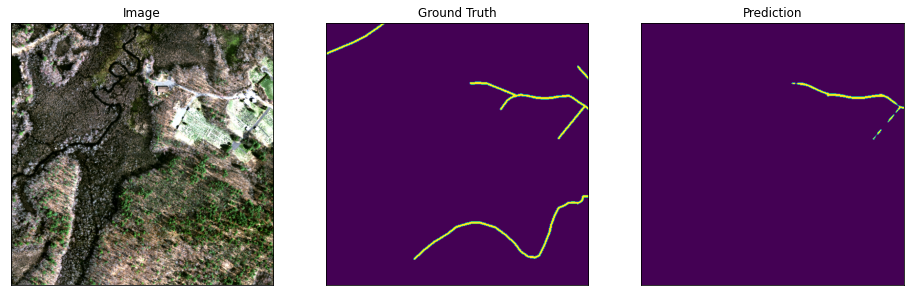

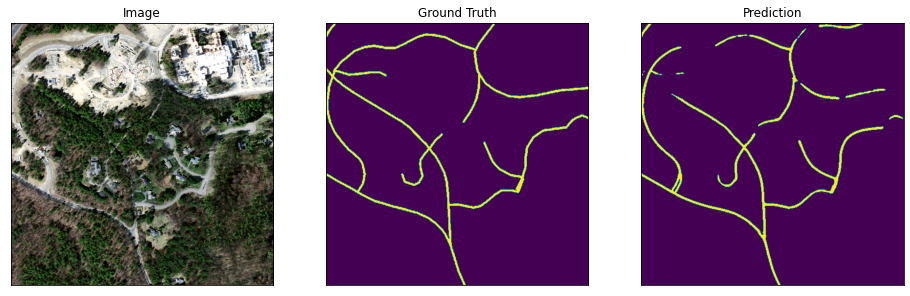

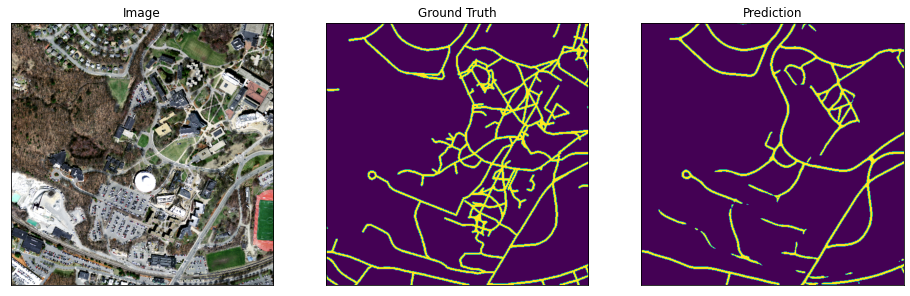

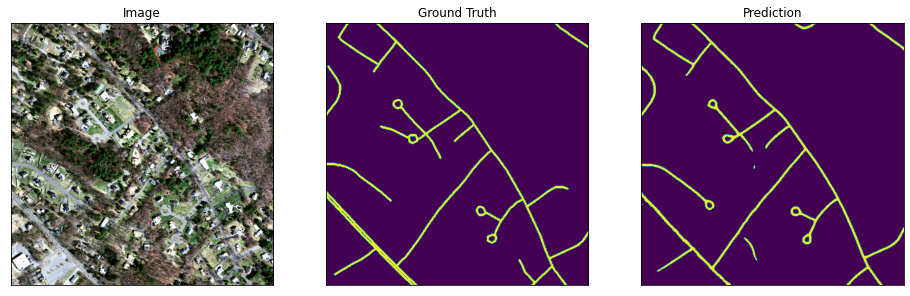

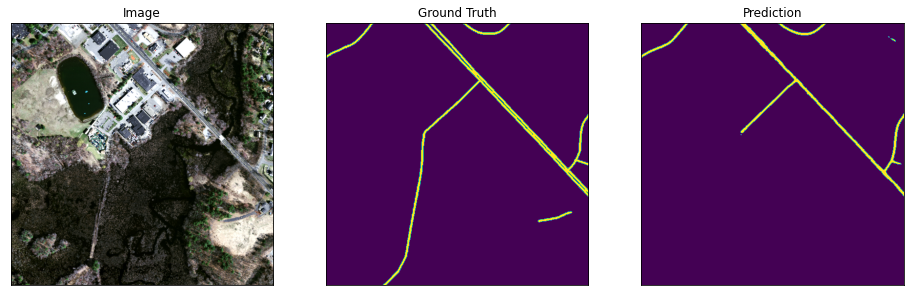

...

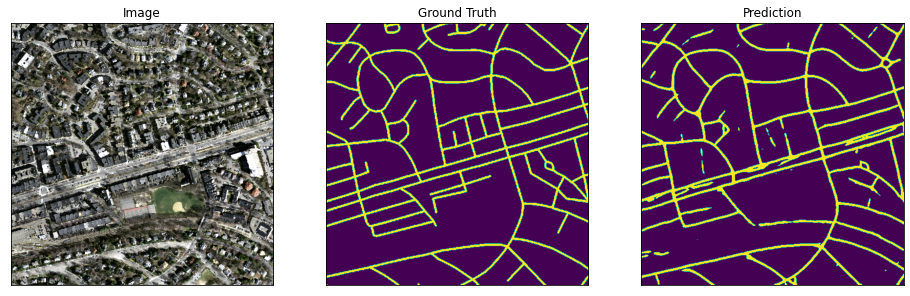

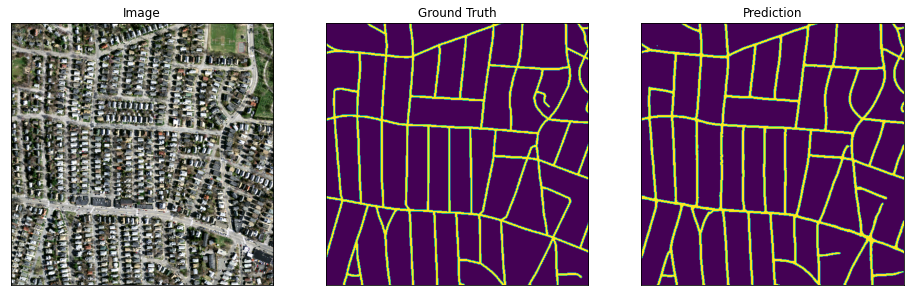

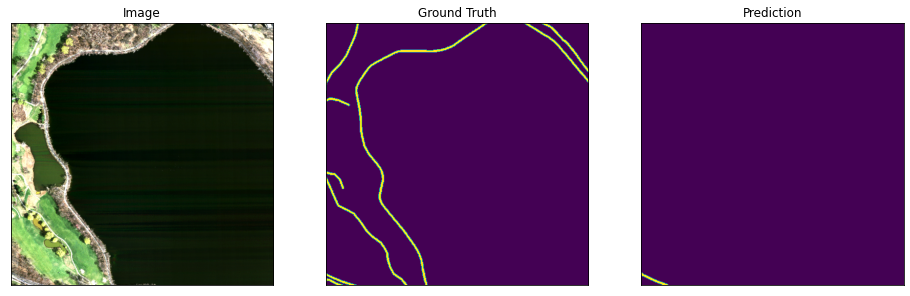

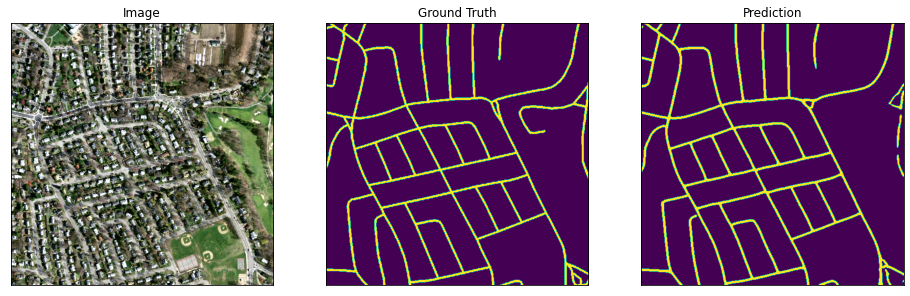

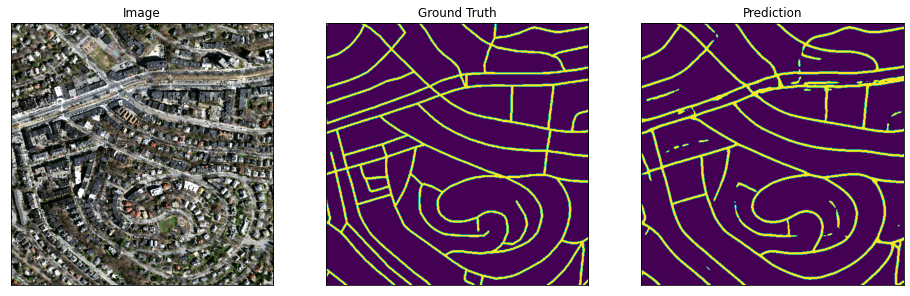

In [45]:
from tqdm import tqdm
ds_iterator =val_ds.__iter__()
for i in range(52):
    ds_next_element = next(ds_iterator)
    batch_of_imgs = ds_next_element[0].numpy() 
    gt = ds_next_element[1].numpy()
    pred = model.predict(batch_of_imgs)
    pred = np.where(np.squeeze(pred[0], axis=(-1, )) > 0.5, 255, 0)    
    gt = np.where(np.squeeze(gt[0], axis=(-1, )) > 0.5, 255, 0)
    input_img = batch_of_imgs[0] 
    visualize(
        image=denormalize(input_img.squeeze()),
        ground_truth = gt,
        prediction = pred
    )
